In [19]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.offline
from plotly.subplots import make_subplots
import plotly.express as px
from sklearn.preprocessing import MinMaxScaler

from pptoolbox.platform import preprocess, WAVELENGTHS_3NM_V1
from pptoolbox.preprocessing import SNV, MSC, SavitzkyGolay, Detrend
from pptoolbox.visualization import (plot_spectra, plot_loadings, plot_scree, fit_pca,
                                               generate_pc_df, plot_svp, initialize_theme, spectral_vector_properties)

from sklearn.feature_selection import f_classif, mutual_info_classif, chi2

In [2]:
plotly.offline.init_notebook_mode()
qualitative_cmap, diverging_cmap, light_cmap = initialize_theme()

Registered profileprint_light_cmap
Registered profileprint_diverging_cmap


In [ ]:
datetime = '241003'

In [76]:
import os
import sys
sys.path.append(os.path.dirname(os.getcwd()))

raw_df = pd.read_csv(f'../data/raw/spectra_{datetime}.csv')
label_df = pd.read_csv(f'../data/raw/label_{datetime}.csv')
# print(raw_df.shape, label_df.shape)


In [77]:
raw_df.head()

,lot_id,specimen_id,lot_name,date_scanned,analyser_id,company_id,product_id,product_name,raw_data,dark_ref_data,white_ref_data,dark_ref_scan_time,white_ref_scan_time
0,80086,481793,ML2326565,1729215106,50,1303,6711,Fuel,"[{""wavelength"": 338.550537109375, ""reflectance...","[24.981453488372093, 28.080697674418605, 27.44...","[24.20936046511628, 27.756918604651162, 26.746...",1729214866,1729214895
1,80086,481794,ML2326565,1729215143,50,1303,6711,Fuel,"[{""wavelength"": 338.550537109375, ""reflectance...","[24.981453488372093, 28.080697674418605, 27.44...","[24.20936046511628, 27.756918604651162, 26.746...",1729214866,1729214895
2,80086,481795,ML2326565,1729215160,50,1303,6711,Fuel,"[{""wavelength"": 338.550537109375, ""reflectance...","[24.981453488372093, 28.080697674418605, 27.44...","[24.20936046511628, 27.756918604651162, 26.746...",1729214866,1729214895
3,80086,481796,ML2326565,1729215171,50,1303,6711,Fuel,"[{""wavelength"": 338.550537109375, ""reflectance...","[24.981453488372093, 28.080697674418605, 27.44...","[24.20936046511628, 27.756918604651162, 26.746...",1729214866,1729214895
4,80094,481821,ML2330816,1729217081,50,1303,6711,Fuel,"[{""wavelength"": 338.550537109375, ""reflectance...","[24.981453488372093, 28.080697674418605, 27.44...","[24.20936046511628, 27.756918604651162, 26.746...",1729214866,1729214895


In [79]:
label_df = label_df.drop(columns = 'lot_name')

raw_df, label_df = preprocess(raw_df, label_df,  wavelengths=WAVELENGTHS_3NM_V1)

In [80]:
label_type_list = ['clf'] # or reg
param_label_map = dict(zip(label_df.columns, label_type_list))
param_label_map

{'type': 'clf'}

# Check for Outliers

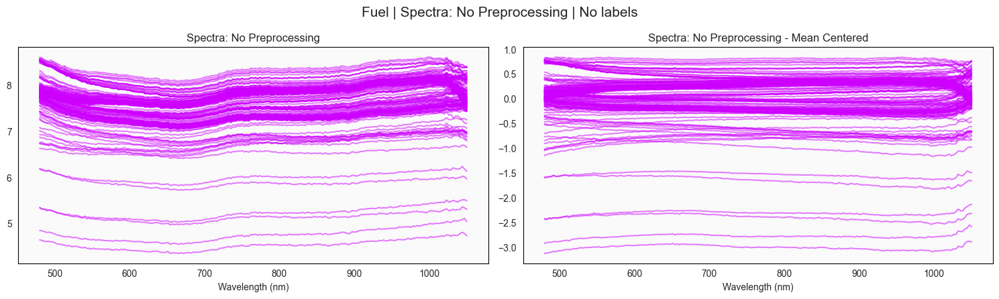

In [81]:
PREPROCESSING = 'No Preprocessing'
SAMPLE_TYPE = 'Fuel' #! change this
cmap=sns.color_palette()

plot_spectra(raw_df, labels=None,
             spec_prep=PREPROCESSING,
             sample_type=SAMPLE_TYPE,
             cmap=cmap);

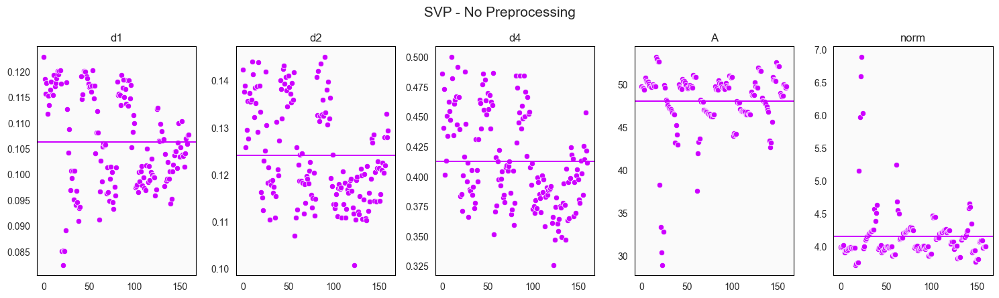

In [82]:
plot_svp(raw_df, title='SVP - No Preprocessing')

In [90]:
raw_df_check = pd.DataFrame(raw_df)
svp_arr = spectral_vector_properties(raw_df_check, True)

anomalous_df = svp_arr[svp_arr['norm']>5] #! change this

anomalous_df

,d1,d2,d4,A,norm
lot_id,,,,,
80060,0.085030,0.116225,0.383011,38.277673,5.145283
80060,0.082332,0.115018,0.384918,33.332743,5.958177
80060,0.085216,0.112272,0.370995,30.350402,6.583598
80060,0.084994,0.122914,0.400711,28.910661,6.880975
80060,0.089068,0.125006,0.416212,32.791865,6.026648
80070,0.091096,0.121953,0.412113,37.524268,5.233070


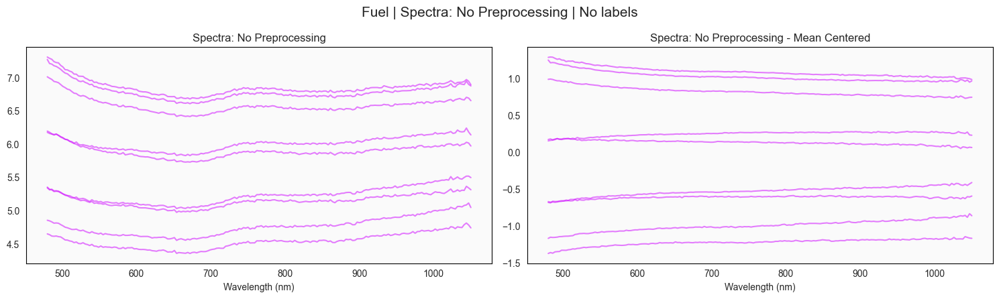

In [91]:
anomalous_df = anomalous_df.reset_index()
check_df = raw_df.reset_index()
check_df = check_df[check_df['lot_id'].isin(anomalous_df['lot_id'])]
check_df = check_df.set_index('lot_id')

plot_spectra(check_df, labels=None,
             spec_prep=PREPROCESSING,
             sample_type=SAMPLE_TYPE,
             cmap=cmap);

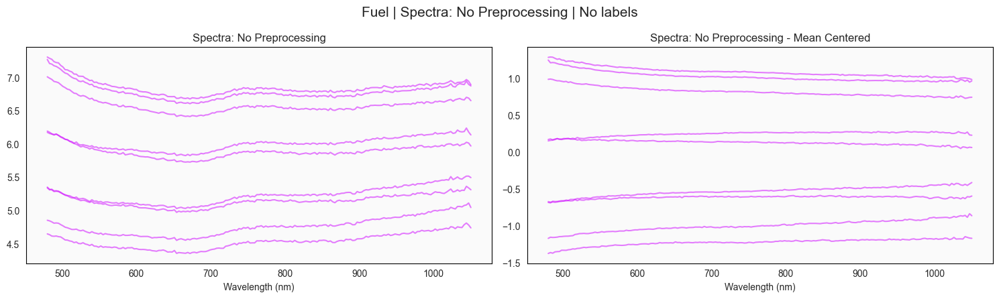

In [89]:
plot_spectra(check_df, labels=None,
             spec_prep=PREPROCESSING,
             sample_type=SAMPLE_TYPE,
             cmap=cmap);

In [106]:
# filter out the outlier scans
# mask = (raw_df.iloc[:, -1] < 80) & (raw_df.iloc[:, -1] > 10)
# mask
# raw_df = raw_df.loc[mask, :]
# label_df = label_df.loc[mask, :]

# No Preprocessing

In [35]:
# CONFIGS
plot_df = raw_df.copy()
cmap=sns.color_palette()

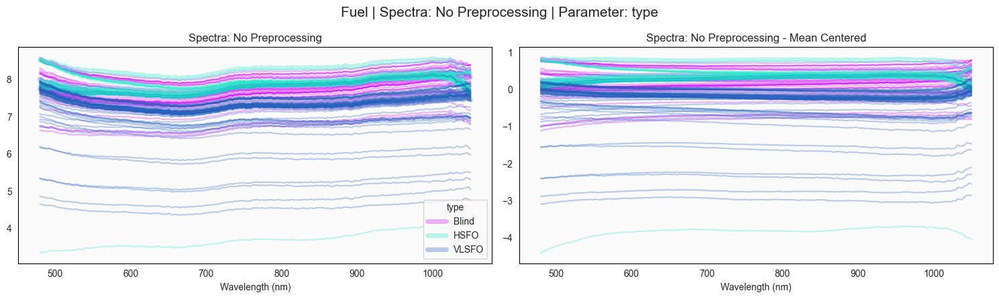

In [36]:
for param, label_type in param_label_map.items():
    plot_spectra(plot_df, labels=label_df[[param]],
                 label_type=label_type,
                 spec_prep=PREPROCESSING,
                 sample_type=SAMPLE_TYPE,
                 cmap=cmap)

Total Explained Variance: 99.980% 
Number of Components: 3


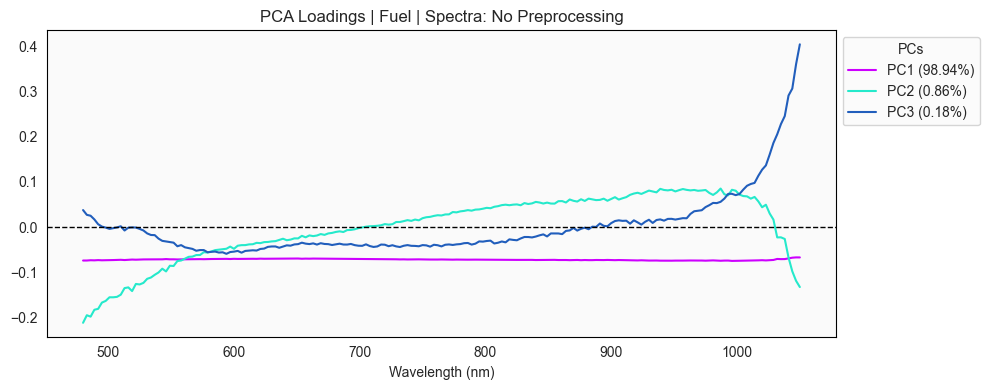

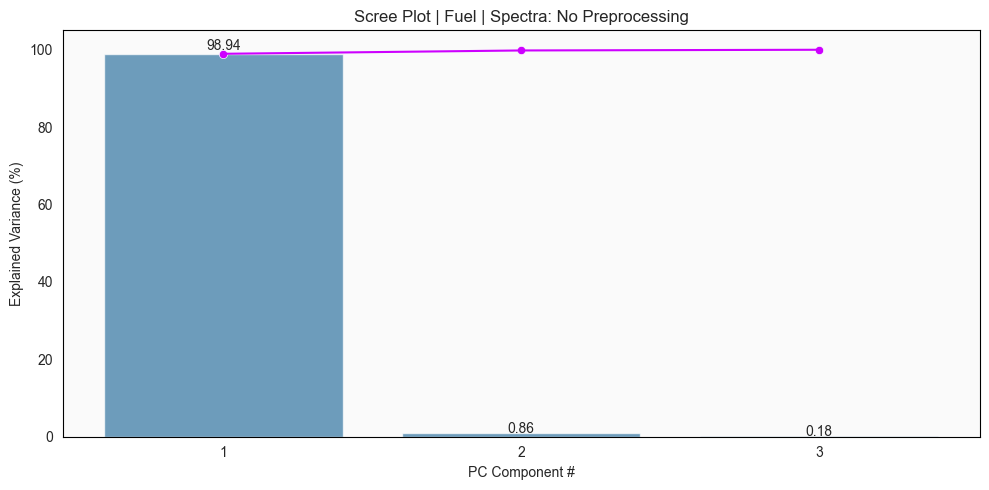

In [37]:
N_COMP = 0.999
RANDOM_STATE = 42

fitted_pc, pc_labels = fit_pca(plot_df, N_COMP, RANDOM_STATE)
fig2, ax2 = plot_loadings(plot_df, fitted_pc, pc_labels, 
                          spec_prep=PREPROCESSING, 
                          sample_type=SAMPLE_TYPE)
fig1, ax1 = plot_scree(fitted_pc,
                       spec_prep=PREPROCESSING, 
                       sample_type=SAMPLE_TYPE)
print(f"""Total Explained Variance: {fitted_pc.explained_variance_ratio_.sum()*100:.3f}% 
Number of Components: {len(fitted_pc.explained_variance_ratio_)}""")

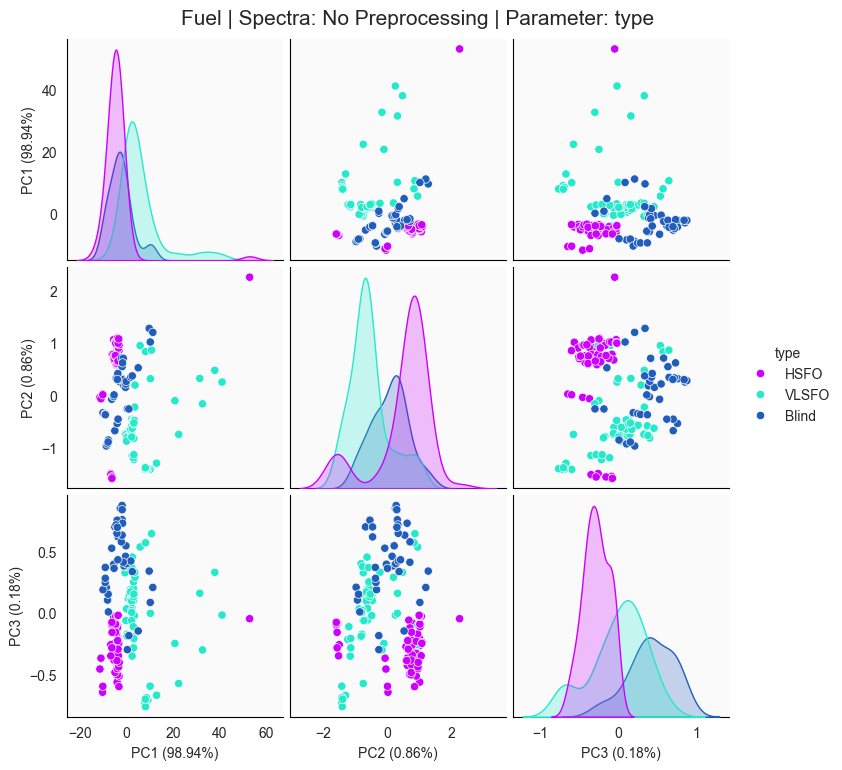

In [38]:
for param in param_label_map.keys():
    pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df[[param]])
    sns.pairplot(data=pc_df.reset_index().drop('lot_id', axis=1), hue=param)
    plt.suptitle(f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING} | Parameter: {param}', y=1.02, size=15)

In [24]:
fig = make_subplots(rows=3, cols= 2, 
                    subplot_titles=['F Test Spectra', 'F Test PCA', 
                                    'Mutual Info Spectra', 'Mutual Info PCA',
                                    'Chi2 Spectra', 'Chi2 PCA'],
                    specs=[[{'secondary_y': True}, {'secondary_y': True}],
                           [{'secondary_y': False}, {'secondary_y': False}],
                           [{'secondary_y': True}, {'secondary_y': True}]],
                    horizontal_spacing=0.15,
                    vertical_spacing=0.1)

title = f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING}'
colors = px.colors.qualitative.Plotly
pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df)
n_comp = fitted_pc.n_components_

for i, param in enumerate(param_label_map.keys()):
    try:
        f_reg_spec = f_classif(plot_df, label_df[param].values.ravel())
        f_reg_pca = f_classif(pc_df.iloc[:, :n_comp], pc_df[param].values.ravel())
        mms = MinMaxScaler()
        scaled_spec = mms.fit_transform(plot_df)
        scaled_pca = mms.fit_transform(pc_df.iloc[:, :n_comp])
        mi_spec = mutual_info_classif(scaled_spec, label_df[param].values.ravel())
        mi_pca = mutual_info_classif(scaled_pca, pc_df[param].values.ravel())
        chi2_spec = chi2(scaled_spec, label_df[param].values.ravel())
        chi2_pca = chi2(scaled_pca, pc_df[param].values.ravel())
        
        fig.add_trace(
            go.Scatter(x=plot_df.columns, y=f_reg_spec[0], marker_color=colors[i], name=param,
                       opacity=0.5, showlegend=False),
                       secondary_y=False,row=1, col=1)

        fig.add_trace(
            go.Scatter(x=plot_df.columns, y=f_reg_spec[1], name=param, marker_color=colors[i]),
                    secondary_y=True, row=1, col=1)
        
        fig.add_trace(
            go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[0], marker_color=colors[i], name=param,
                       opacity=0.5, showlegend=False),
                       secondary_y=False,row=1, col=2)

        fig.add_trace(
            go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[1], showlegend=False,
                       name=param, marker_color=colors[i]),
                    secondary_y=True, row=1, col=2)
        
        fig.add_trace(
            go.Scatter(x=plot_df.columns, y=mi_spec, marker_color=colors[i], name=param,
                       opacity=0.8, showlegend=False),
                       secondary_y=False,row=2, col=1)

        fig.add_trace(
            go.Scatter(x=pc_df.columns[:n_comp], y=mi_pca, name=param, marker_color=colors[i],
                       showlegend=False, opacity=0.8),
                    secondary_y=False, row=2, col=2)
        
        fig.add_trace(
            go.Scatter(x=plot_df.columns, y=chi2_spec[0], marker_color=colors[i], name=param,
                       opacity=0.5, showlegend=False),
                       secondary_y=False,row=3, col=1)

        fig.add_trace(
            go.Scatter(x=plot_df.columns, y=chi2_spec[1], name=param, marker_color=colors[i]),
                    secondary_y=True, row=3, col=1)
        
        fig.add_trace(
            go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[0], marker_color=colors[i], name=param,
                       opacity=0.5, showlegend=False),
                       secondary_y=False,row=3, col=2)

        fig.add_trace(
            go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[1], showlegend=False,
                       name=param, marker_color=colors[i]),
                    secondary_y=True, row=3, col=2)
        
    except:
        pass

# Add figure title
fig.update_layout(title_text=title, height=1400, width=1400)
fig.update_xaxes(title_text="Wavelengths (nm)", col=1)
fig.update_xaxes(title_text="No. of PCs", col=2)

# Set y-axes titles
fig.update_yaxes(title_text="F value", secondary_y=False, row=1)
fig.update_yaxes(title_text="p value", secondary_y=True, row=1)
fig.update_yaxes(title_text="Mutual Information", secondary_y=False, row=2)
fig.update_yaxes(title_text="Chi2", secondary_y=False, row=3)
fig.update_yaxes(title_text="p value", secondary_y=True, row=3)

fig.show()

# SNV

In [39]:
# CONFIGS
snv_df = pd.DataFrame(SNV().fit_transform(raw_df), columns=raw_df.columns, index=raw_df.index)
plot_df = snv_df.copy()
PREPROCESSING = 'SNV'

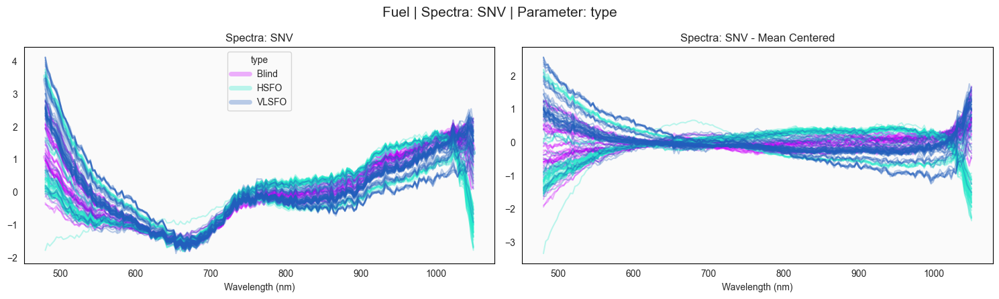

In [40]:
for param, label_type in param_label_map.items():
    plot_spectra(plot_df, labels=label_df[[param]],
                 label_type=label_type,
                 spec_prep=PREPROCESSING,
                 sample_type=SAMPLE_TYPE,
                 cmap=cmap)

Total Explained Variance: 99.265% 
Number of Components: 4


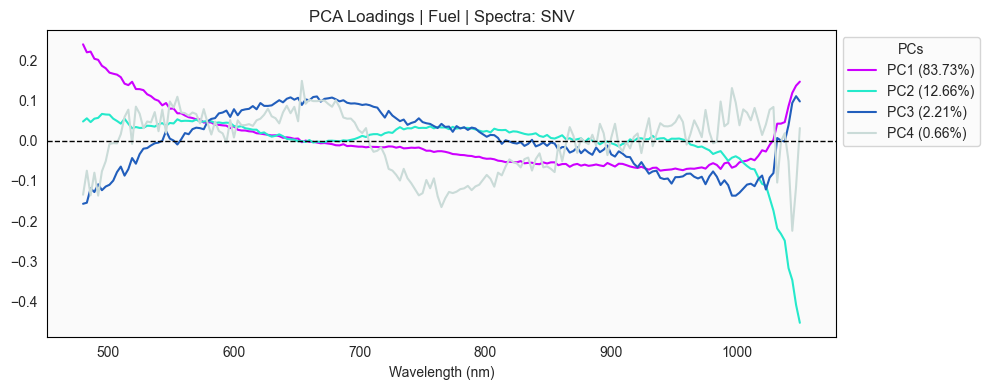

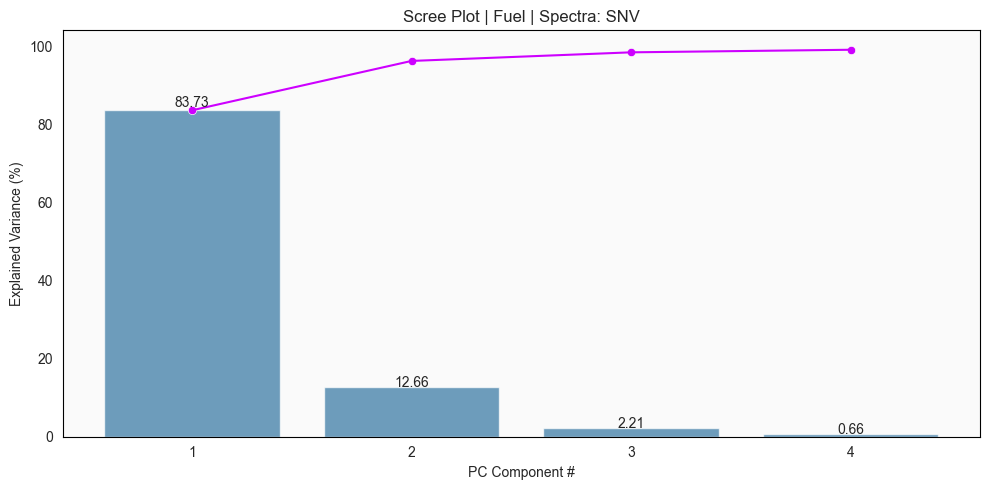

In [41]:
N_COMP = 0.99
RANDOM_STATE = 42

fitted_pc, pc_labels = fit_pca(plot_df, N_COMP, RANDOM_STATE)
fig2, ax2 = plot_loadings(plot_df, fitted_pc, pc_labels, 
                          spec_prep=PREPROCESSING, 
                          sample_type=SAMPLE_TYPE)
fig1, ax1 = plot_scree(fitted_pc,
                       spec_prep=PREPROCESSING, 
                       sample_type=SAMPLE_TYPE)
print(f"""Total Explained Variance: {fitted_pc.explained_variance_ratio_.sum()*100:.3f}% 
Number of Components: {len(fitted_pc.explained_variance_ratio_)}""")

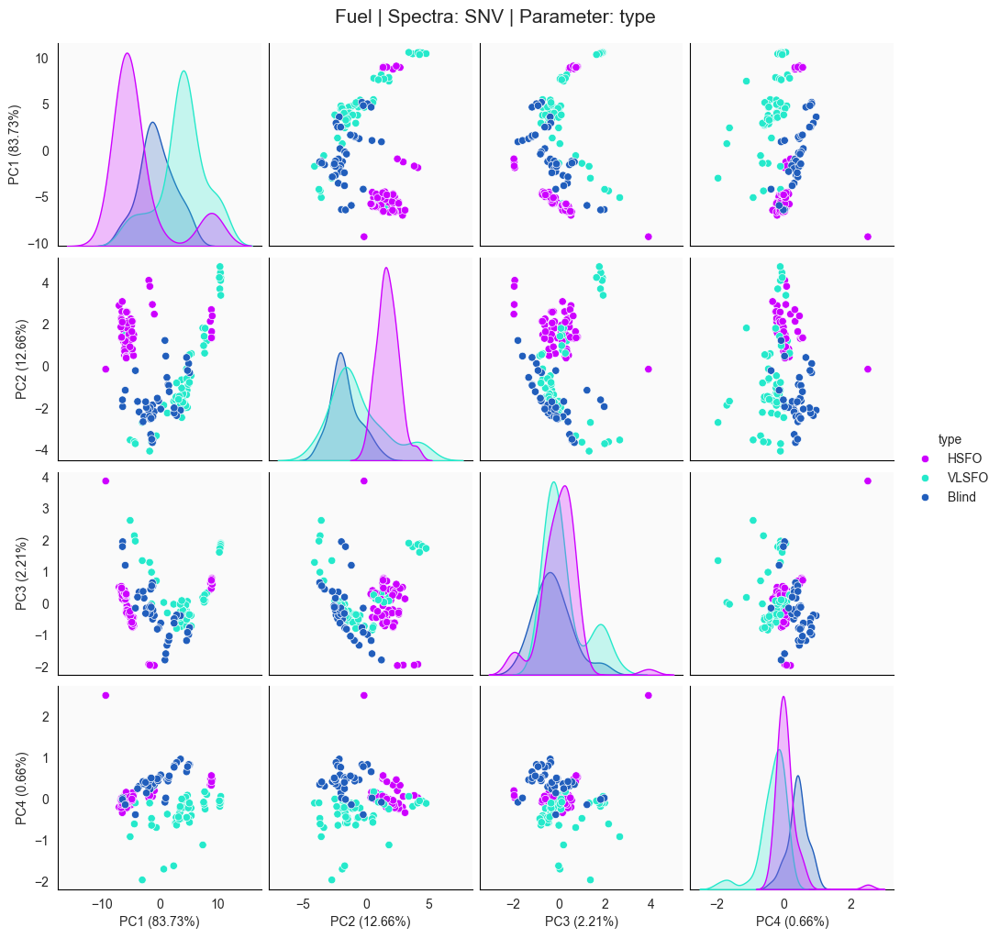

In [42]:
for param in param_label_map.keys():
    pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df[[param]])
    sns.pairplot(data=pc_df.reset_index().drop('lot_id', axis=1), hue=param)
    plt.suptitle(f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING} | Parameter: {param}', y=1.02, size=15)

In [25]:
fig = make_subplots(rows=3, cols= 2, 
                    subplot_titles=['F Test Spectra', 'F Test PCA', 
                                    'Mutual Info Spectra', 'Mutual Info PCA',
                                    'Chi2 Spectra', 'Chi2 PCA'],
                    specs=[[{'secondary_y': True}, {'secondary_y': True}],
                           [{'secondary_y': False}, {'secondary_y': False}],
                           [{'secondary_y': True}, {'secondary_y': True}]],
                    horizontal_spacing=0.15,
                    vertical_spacing=0.1)

title = f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING}'
colors = px.colors.qualitative.Plotly
pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df)
n_comp = fitted_pc.n_components_

for i, param in enumerate(param_label_map.keys()):
    try:
        f_reg_spec = f_classif(plot_df, label_df[param].values.ravel())
        f_reg_pca = f_classif(pc_df.iloc[:, :n_comp], pc_df[param].values.ravel())
        mms = MinMaxScaler()
        scaled_spec = mms.fit_transform(plot_df)
        scaled_pca = mms.fit_transform(pc_df.iloc[:, :n_comp])
        mi_spec = mutual_info_classif(scaled_spec, label_df[param].values.ravel())
        mi_pca = mutual_info_classif(scaled_pca, pc_df[param].values.ravel())
        chi2_spec = chi2(scaled_spec, label_df[param].values.ravel())
        chi2_pca = chi2(scaled_pca, pc_df[param].values.ravel())
        
        fig.add_trace(
            go.Scatter(x=plot_df.columns, y=f_reg_spec[0], marker_color=colors[i], name=param,
                       opacity=0.5, showlegend=False),
                       secondary_y=False,row=1, col=1)

        fig.add_trace(
            go.Scatter(x=plot_df.columns, y=f_reg_spec[1], name=param, marker_color=colors[i]),
                    secondary_y=True, row=1, col=1)
        
        fig.add_trace(
            go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[0], marker_color=colors[i], name=param,
                       opacity=0.5, showlegend=False),
                       secondary_y=False,row=1, col=2)

        fig.add_trace(
            go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[1], showlegend=False,
                       name=param, marker_color=colors[i]),
                    secondary_y=True, row=1, col=2)
        
        fig.add_trace(
            go.Scatter(x=plot_df.columns, y=mi_spec, marker_color=colors[i], name=param,
                       opacity=0.8, showlegend=False),
                       secondary_y=False,row=2, col=1)

        fig.add_trace(
            go.Scatter(x=pc_df.columns[:n_comp], y=mi_pca, name=param, marker_color=colors[i],
                       showlegend=False, opacity=0.8),
                    secondary_y=False, row=2, col=2)
        
        fig.add_trace(
            go.Scatter(x=plot_df.columns, y=chi2_spec[0], marker_color=colors[i], name=param,
                       opacity=0.5, showlegend=False),
                       secondary_y=False,row=3, col=1)

        fig.add_trace(
            go.Scatter(x=plot_df.columns, y=chi2_spec[1], name=param, marker_color=colors[i]),
                    secondary_y=True, row=3, col=1)
        
        fig.add_trace(
            go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[0], marker_color=colors[i], name=param,
                       opacity=0.5, showlegend=False),
                       secondary_y=False,row=3, col=2)

        fig.add_trace(
            go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[1], showlegend=False,
                       name=param, marker_color=colors[i]),
                    secondary_y=True, row=3, col=2)
        
    except:
        pass

# Add figure title
fig.update_layout(title_text=title, height=1400, width=1400)
fig.update_xaxes(title_text="Wavelengths (nm)", col=1)
fig.update_xaxes(title_text="No. of PCs", col=2)

# Set y-axes titles
fig.update_yaxes(title_text="F value", secondary_y=False, row=1)
fig.update_yaxes(title_text="p value", secondary_y=True, row=1)
fig.update_yaxes(title_text="Mutual Information", secondary_y=False, row=2)
fig.update_yaxes(title_text="Chi2", secondary_y=False, row=3)
fig.update_yaxes(title_text="p value", secondary_y=True, row=3)

fig.show()

# Detrend

In [56]:
# CONFIGS
msc = Detrend()
msc_df = pd.DataFrame(msc.fit_transform(raw_df), columns=raw_df.columns, index=raw_df.index)
plot_df = msc_df.copy()
PREPROCESSING = 'Detrend'

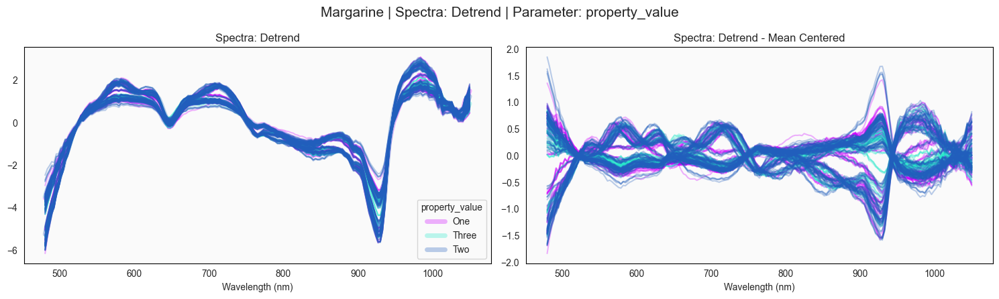

In [57]:
for param, label_type in param_label_map.items():
    plot_spectra(plot_df, labels=label_df[[param]],
                 label_type=label_type,
                 spec_prep=PREPROCESSING,
                 sample_type=SAMPLE_TYPE,
                 cmap=cmap)

Total Explained Variance: 99.114% 
Number of Components: 5


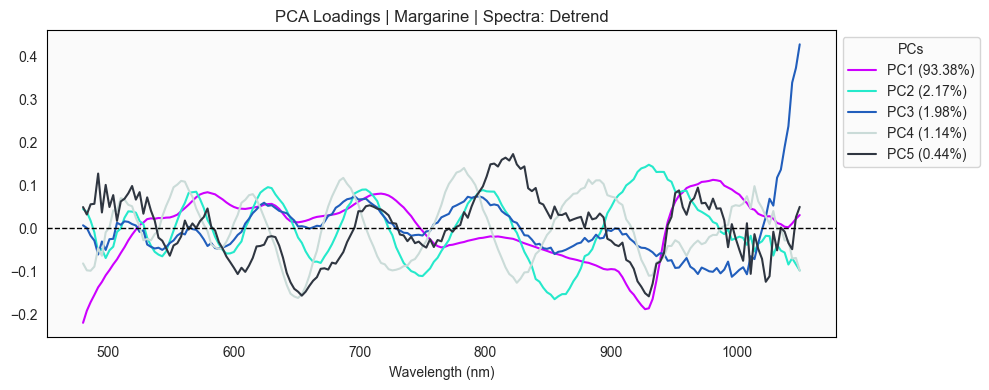

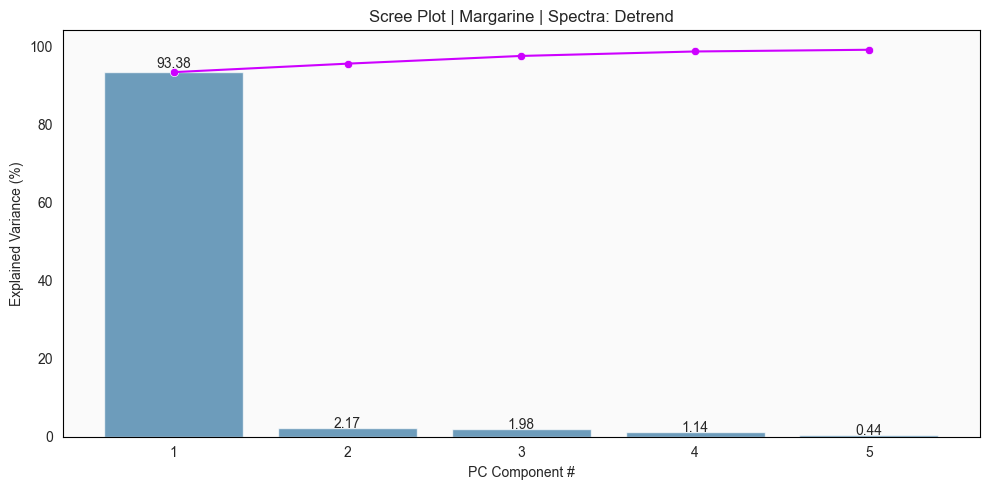

In [58]:
N_COMP = 0.99
RANDOM_STATE = 42

fitted_pc, pc_labels = fit_pca(plot_df, N_COMP, RANDOM_STATE)
fig2, ax2 = plot_loadings(plot_df, fitted_pc, pc_labels, 
                          spec_prep=PREPROCESSING, 
                          sample_type=SAMPLE_TYPE)
fig1, ax1 = plot_scree(fitted_pc,
                       spec_prep=PREPROCESSING, 
                       sample_type=SAMPLE_TYPE)
print(f"""Total Explained Variance: {fitted_pc.explained_variance_ratio_.sum()*100:.3f}% 
Number of Components: {len(fitted_pc.explained_variance_ratio_)}""")

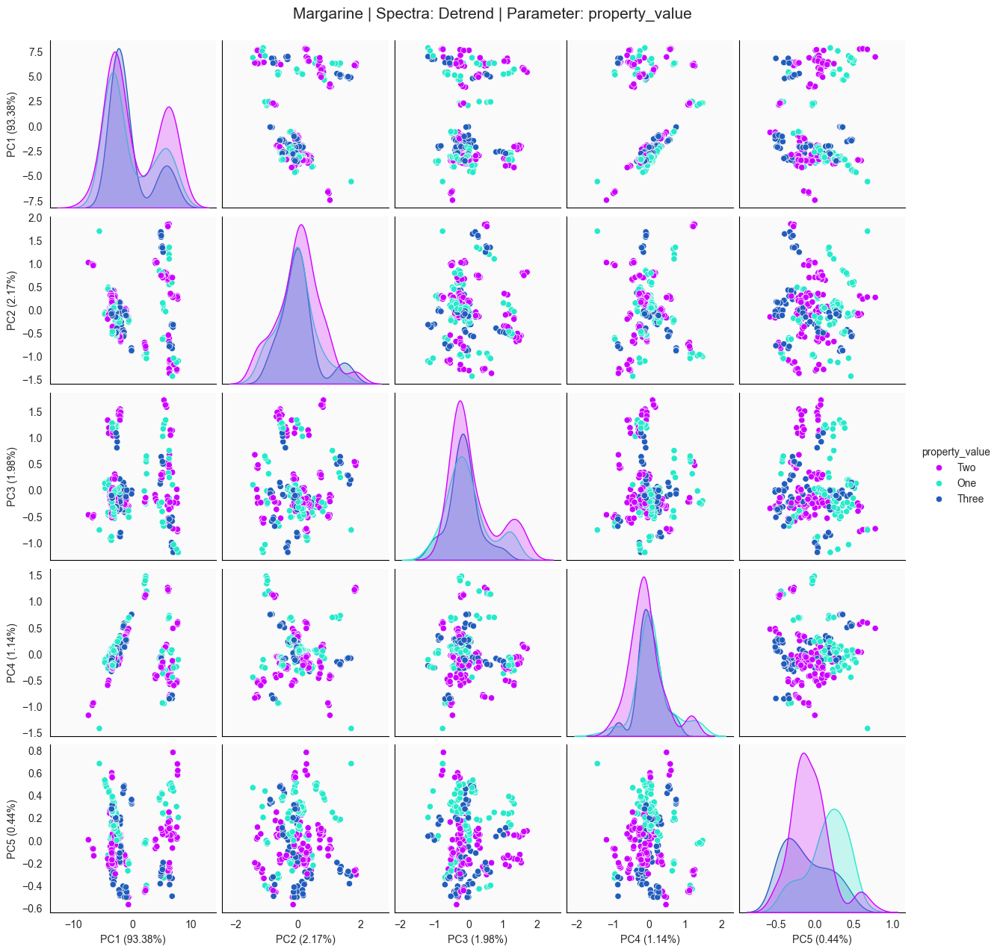

In [59]:
for param in param_label_map.keys():
    pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df[[param]])
    sns.pairplot(data=pc_df.reset_index().drop('lot_id', axis=1), hue=param)
    plt.suptitle(f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING} | Parameter: {param}', y=1.02, size=15)

In [30]:
fig = make_subplots(rows=3, cols= 2, 
                    subplot_titles=['F Test Spectra', 'F Test PCA', 
                                    'Mutual Info Spectra', 'Mutual Info PCA',
                                    'Chi2 Spectra', 'Chi2 PCA'],
                    specs=[[{'secondary_y': True}, {'secondary_y': True}],
                           [{'secondary_y': False}, {'secondary_y': False}],
                           [{'secondary_y': True}, {'secondary_y': True}]],
                    horizontal_spacing=0.15,
                    vertical_spacing=0.1)

title = f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING}'
colors = px.colors.qualitative.Plotly
pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df)
n_comp = fitted_pc.n_components_

for i, param in enumerate(param_label_map.keys()):
    try:
        f_reg_spec = f_classif(plot_df, label_df[param].values.ravel())
        f_reg_pca = f_classif(pc_df.iloc[:, :n_comp], pc_df[param].values.ravel())
        mms = MinMaxScaler()
        scaled_spec = mms.fit_transform(plot_df)
        scaled_pca = mms.fit_transform(pc_df.iloc[:, :n_comp])
        mi_spec = mutual_info_classif(scaled_spec, label_df[param].values.ravel())
        mi_pca = mutual_info_classif(scaled_pca, pc_df[param].values.ravel())
        chi2_spec = chi2(scaled_spec, label_df[param].values.ravel())
        chi2_pca = chi2(scaled_pca, pc_df[param].values.ravel())
        
        fig.add_trace(
            go.Scatter(x=plot_df.columns, y=f_reg_spec[0], marker_color=colors[i], name=param,
                       opacity=0.5, showlegend=False),
                       secondary_y=False,row=1, col=1)

        fig.add_trace(
            go.Scatter(x=plot_df.columns, y=f_reg_spec[1], name=param, marker_color=colors[i]),
                    secondary_y=True, row=1, col=1)
        
        fig.add_trace(
            go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[0], marker_color=colors[i], name=param,
                       opacity=0.5, showlegend=False),
                       secondary_y=False,row=1, col=2)

        fig.add_trace(
            go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[1], showlegend=False,
                       name=param, marker_color=colors[i]),
                    secondary_y=True, row=1, col=2)
        
        fig.add_trace(
            go.Scatter(x=plot_df.columns, y=mi_spec, marker_color=colors[i], name=param,
                       opacity=0.8, showlegend=False),
                       secondary_y=False,row=2, col=1)

        fig.add_trace(
            go.Scatter(x=pc_df.columns[:n_comp], y=mi_pca, name=param, marker_color=colors[i],
                       showlegend=False, opacity=0.8),
                    secondary_y=False, row=2, col=2)
        
        fig.add_trace(
            go.Scatter(x=plot_df.columns, y=chi2_spec[0], marker_color=colors[i], name=param,
                       opacity=0.5, showlegend=False),
                       secondary_y=False,row=3, col=1)

        fig.add_trace(
            go.Scatter(x=plot_df.columns, y=chi2_spec[1], name=param, marker_color=colors[i]),
                    secondary_y=True, row=3, col=1)
        
        fig.add_trace(
            go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[0], marker_color=colors[i], name=param,
                       opacity=0.5, showlegend=False),
                       secondary_y=False,row=3, col=2)

        fig.add_trace(
            go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[1], showlegend=False,
                       name=param, marker_color=colors[i]),
                    secondary_y=True, row=3, col=2)
        
    except:
        pass

# Add figure title
fig.update_layout(title_text=title, height=1400, width=1400)
fig.update_xaxes(title_text="Wavelengths (nm)", col=1)
fig.update_xaxes(title_text="No. of PCs", col=2)

# Set y-axes titles
fig.update_yaxes(title_text="F value", secondary_y=False, row=1)
fig.update_yaxes(title_text="p value", secondary_y=True, row=1)
fig.update_yaxes(title_text="Mutual Information", secondary_y=False, row=2)
fig.update_yaxes(title_text="Chi2", secondary_y=False, row=3)
fig.update_yaxes(title_text="p value", secondary_y=True, row=3)

fig.show()

# SNV-Detrend

In [32]:
# CONFIGS
snv_df = pd.DataFrame(Detrend().fit_transform(SNV().fit_transform(raw_df)), columns=raw_df.columns, index=raw_df.index)
plot_df = snv_df.copy()
PREPROCESSING = 'SNV-Detrend'

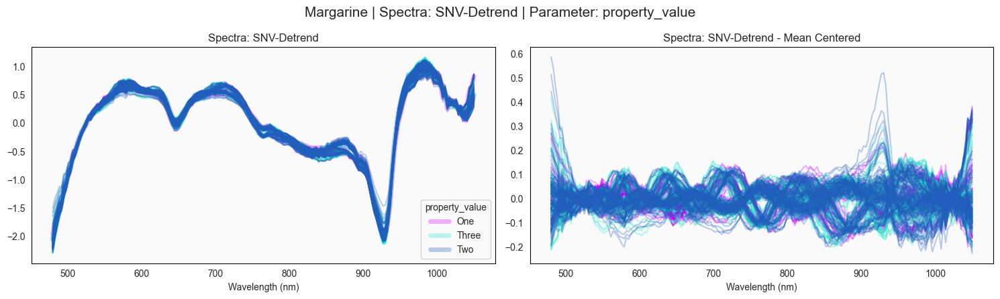

In [33]:
for param, label_type in param_label_map.items():
    plot_spectra(plot_df, labels=label_df[[param]],
                 label_type=label_type,
                 spec_prep=PREPROCESSING,
                 sample_type=SAMPLE_TYPE,
                 cmap=cmap)

Total Explained Variance: 99.017% 
Number of Components: 40


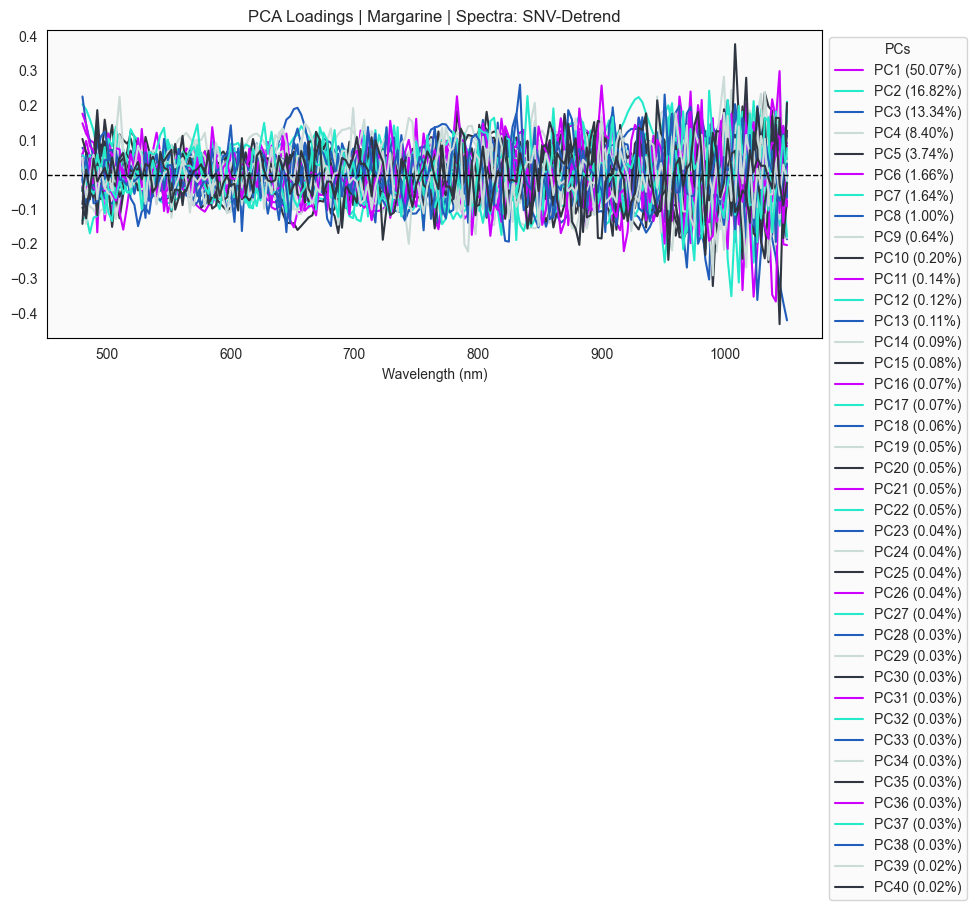

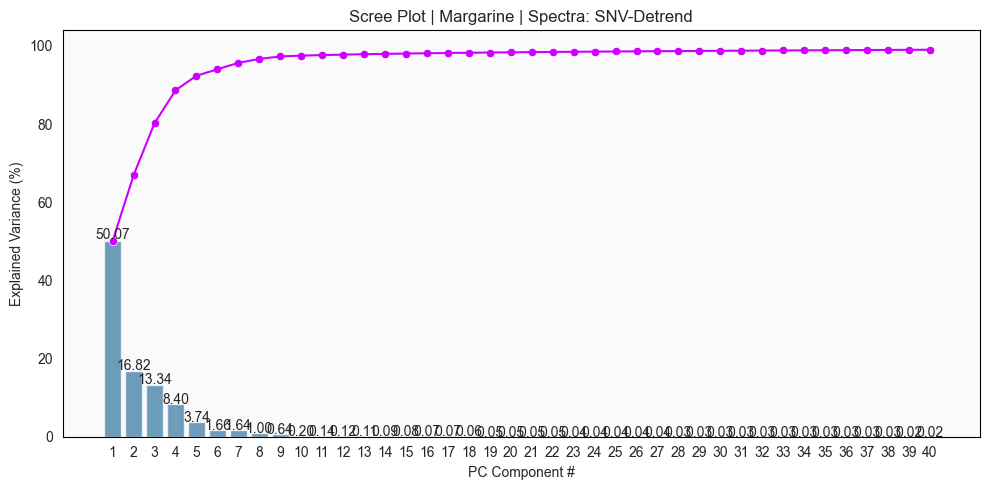

In [34]:
N_COMP = 0.99
RANDOM_STATE = 42

fitted_pc, pc_labels = fit_pca(plot_df, N_COMP, RANDOM_STATE)
fig2, ax2 = plot_loadings(plot_df, fitted_pc, pc_labels, 
                          spec_prep=PREPROCESSING, 
                          sample_type=SAMPLE_TYPE)
fig1, ax1 = plot_scree(fitted_pc,
                       spec_prep=PREPROCESSING, 
                       sample_type=SAMPLE_TYPE)
print(f"""Total Explained Variance: {fitted_pc.explained_variance_ratio_.sum()*100:.3f}% 
Number of Components: {len(fitted_pc.explained_variance_ratio_)}""")

In [ ]:
for param in param_label_map.keys():
    pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df[[param]])
    sns.pairplot(data=pc_df.reset_index().drop('lot_id', axis=1), hue=param)
    plt.suptitle(f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING} | Parameter: {param}', y=1.02, size=15)

In [ ]:
fig = make_subplots(rows=3, cols= 2, 
                    subplot_titles=['F Test Spectra', 'F Test PCA', 
                                    'Mutual Info Spectra', 'Mutual Info PCA',
                                    'Chi2 Spectra', 'Chi2 PCA'],
                    specs=[[{'secondary_y': True}, {'secondary_y': True}],
                           [{'secondary_y': False}, {'secondary_y': False}],
                           [{'secondary_y': True}, {'secondary_y': True}]],
                    horizontal_spacing=0.15,
                    vertical_spacing=0.1)

title = f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING}'
colors = px.colors.qualitative.Plotly
pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df)
n_comp = fitted_pc.n_components_

for i, param in enumerate(param_label_map.keys()):
    try:
        f_reg_spec = f_classif(plot_df, label_df[param].values.ravel())
        f_reg_pca = f_classif(pc_df.iloc[:, :n_comp], pc_df[param].values.ravel())
        mms = MinMaxScaler()
        scaled_spec = mms.fit_transform(plot_df)
        scaled_pca = mms.fit_transform(pc_df.iloc[:, :n_comp])
        mi_spec = mutual_info_classif(scaled_spec, label_df[param].values.ravel())
        mi_pca = mutual_info_classif(scaled_pca, pc_df[param].values.ravel())
        chi2_spec = chi2(scaled_spec, label_df[param].values.ravel())
        chi2_pca = chi2(scaled_pca, pc_df[param].values.ravel())
        
        fig.add_trace(
            go.Scatter(x=plot_df.columns, y=f_reg_spec[0], marker_color=colors[i], name=param,
                       opacity=0.5, showlegend=False),
                       secondary_y=False,row=1, col=1)

        fig.add_trace(
            go.Scatter(x=plot_df.columns, y=f_reg_spec[1], name=param, marker_color=colors[i]),
                    secondary_y=True, row=1, col=1)
        
        fig.add_trace(
            go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[0], marker_color=colors[i], name=param,
                       opacity=0.5, showlegend=False),
                       secondary_y=False,row=1, col=2)

        fig.add_trace(
            go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[1], showlegend=False,
                       name=param, marker_color=colors[i]),
                    secondary_y=True, row=1, col=2)
        
        fig.add_trace(
            go.Scatter(x=plot_df.columns, y=mi_spec, marker_color=colors[i], name=param,
                       opacity=0.8, showlegend=False),
                       secondary_y=False,row=2, col=1)

        fig.add_trace(
            go.Scatter(x=pc_df.columns[:n_comp], y=mi_pca, name=param, marker_color=colors[i],
                       showlegend=False, opacity=0.8),
                    secondary_y=False, row=2, col=2)
        
        fig.add_trace(
            go.Scatter(x=plot_df.columns, y=chi2_spec[0], marker_color=colors[i], name=param,
                       opacity=0.5, showlegend=False),
                       secondary_y=False,row=3, col=1)

        fig.add_trace(
            go.Scatter(x=plot_df.columns, y=chi2_spec[1], name=param, marker_color=colors[i]),
                    secondary_y=True, row=3, col=1)
        
        fig.add_trace(
            go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[0], marker_color=colors[i], name=param,
                       opacity=0.5, showlegend=False),
                       secondary_y=False,row=3, col=2)

        fig.add_trace(
            go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[1], showlegend=False,
                       name=param, marker_color=colors[i]),
                    secondary_y=True, row=3, col=2)
        
    except:
        pass

# Add figure title
fig.update_layout(title_text=title, height=1400, width=1400)
fig.update_xaxes(title_text="Wavelengths (nm)", col=1)
fig.update_xaxes(title_text="No. of PCs", col=2)

# Set y-axes titles
fig.update_yaxes(title_text="F value", secondary_y=False, row=1)
fig.update_yaxes(title_text="p value", secondary_y=True, row=1)
fig.update_yaxes(title_text="Mutual Information", secondary_y=False, row=2)
fig.update_yaxes(title_text="Chi2", secondary_y=False, row=3)
fig.update_yaxes(title_text="p value", secondary_y=True, row=3)

fig.show()

# SG1D9W2P

In [43]:
# CONFIGS
msc = SavitzkyGolay(deriv=1, window=9, polyorder=2)
msc_df = pd.DataFrame(msc.fit_transform(raw_df), 
                      columns=raw_df.columns[4:-4], index=raw_df.index)
plot_df = msc_df.copy()
PREPROCESSING = 'SG1D9W2P'

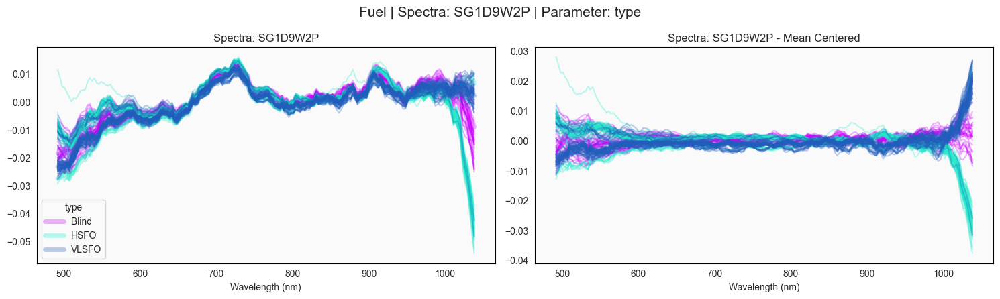

In [44]:
for param, label_type in param_label_map.items():
    plot_spectra(plot_df, labels=label_df[[param]],
                 label_type=label_type,
                 spec_prep=PREPROCESSING,
                 sample_type=SAMPLE_TYPE,
                 cmap=cmap)

Total Explained Variance: 96.495% 
Number of Components: 3


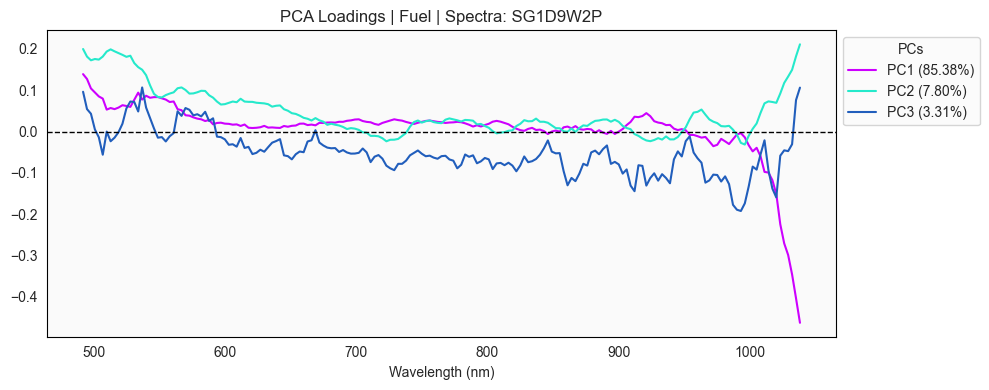

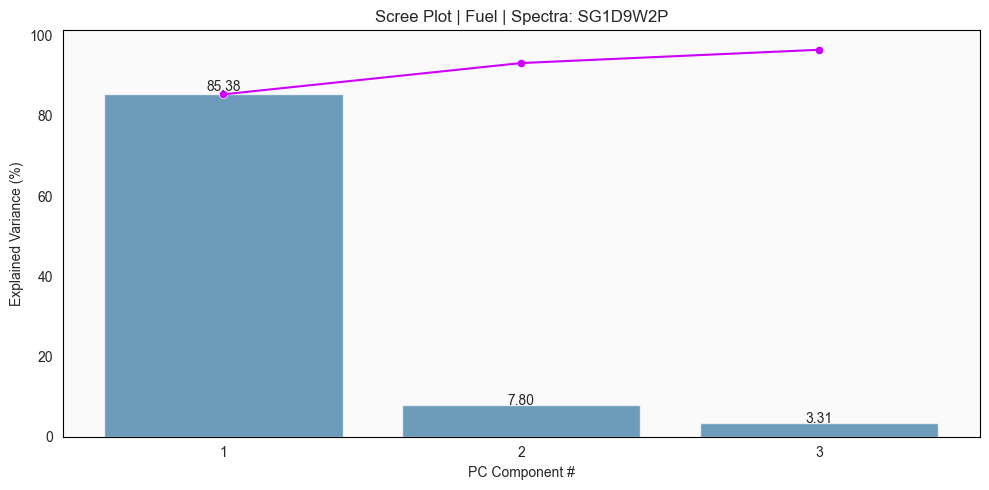

In [45]:
N_COMP = 0.95
RANDOM_STATE = 42

fitted_pc, pc_labels = fit_pca(plot_df, N_COMP, RANDOM_STATE)
fig2, ax2 = plot_loadings(plot_df, fitted_pc, pc_labels, 
                          spec_prep=PREPROCESSING, 
                          sample_type=SAMPLE_TYPE)
fig1, ax1 = plot_scree(fitted_pc,
                       spec_prep=PREPROCESSING, 
                       sample_type=SAMPLE_TYPE)
print(f"""Total Explained Variance: {fitted_pc.explained_variance_ratio_.sum()*100:.3f}% 
Number of Components: {len(fitted_pc.explained_variance_ratio_)}""")

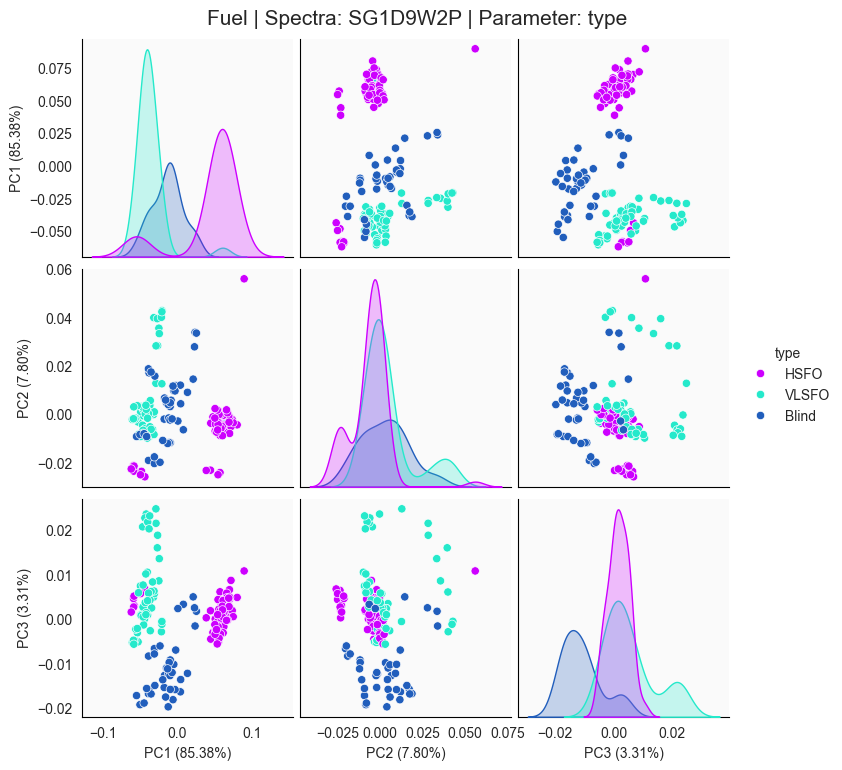

In [46]:
for param in param_label_map.keys():
    pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df[[param]])
    sns.pairplot(data=pc_df.reset_index().drop('lot_id', axis=1), hue=param)
    plt.suptitle(f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING} | Parameter: {param}', y=1.02, size=15)

In [39]:
fig = make_subplots(rows=3, cols= 2, 
                    subplot_titles=['F Test Spectra', 'F Test PCA', 
                                    'Mutual Info Spectra', 'Mutual Info PCA',
                                    'Chi2 Spectra', 'Chi2 PCA'],
                    specs=[[{'secondary_y': True}, {'secondary_y': True}],
                           [{'secondary_y': False}, {'secondary_y': False}],
                           [{'secondary_y': True}, {'secondary_y': True}]],
                    horizontal_spacing=0.15,
                    vertical_spacing=0.1)

title = f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING}'
colors = px.colors.qualitative.Plotly
pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df)
n_comp = fitted_pc.n_components_

for i, param in enumerate(param_label_map.keys()):
    try:
        f_reg_spec = f_classif(plot_df, label_df[param].values.ravel())
        f_reg_pca = f_classif(pc_df.iloc[:, :n_comp], pc_df[param].values.ravel())
        mms = MinMaxScaler()
        scaled_spec = mms.fit_transform(plot_df)
        scaled_pca = mms.fit_transform(pc_df.iloc[:, :n_comp])
        mi_spec = mutual_info_classif(scaled_spec, label_df[param].values.ravel())
        mi_pca = mutual_info_classif(scaled_pca, pc_df[param].values.ravel())
        chi2_spec = chi2(scaled_spec, label_df[param].values.ravel())
        chi2_pca = chi2(scaled_pca, pc_df[param].values.ravel())
        
        fig.add_trace(
            go.Scatter(x=plot_df.columns, y=f_reg_spec[0], marker_color=colors[i], name=param,
                       opacity=0.5, showlegend=False),
                       secondary_y=False,row=1, col=1)

        fig.add_trace(
            go.Scatter(x=plot_df.columns, y=f_reg_spec[1], name=param, marker_color=colors[i]),
                    secondary_y=True, row=1, col=1)
        
        fig.add_trace(
            go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[0], marker_color=colors[i], name=param,
                       opacity=0.5, showlegend=False),
                       secondary_y=False,row=1, col=2)

        fig.add_trace(
            go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[1], showlegend=False,
                       name=param, marker_color=colors[i]),
                    secondary_y=True, row=1, col=2)
        
        fig.add_trace(
            go.Scatter(x=plot_df.columns, y=mi_spec, marker_color=colors[i], name=param,
                       opacity=0.8, showlegend=False),
                       secondary_y=False,row=2, col=1)

        fig.add_trace(
            go.Scatter(x=pc_df.columns[:n_comp], y=mi_pca, name=param, marker_color=colors[i],
                       showlegend=False, opacity=0.8),
                    secondary_y=False, row=2, col=2)
        
        fig.add_trace(
            go.Scatter(x=plot_df.columns, y=chi2_spec[0], marker_color=colors[i], name=param,
                       opacity=0.5, showlegend=False),
                       secondary_y=False,row=3, col=1)

        fig.add_trace(
            go.Scatter(x=plot_df.columns, y=chi2_spec[1], name=param, marker_color=colors[i]),
                    secondary_y=True, row=3, col=1)
        
        fig.add_trace(
            go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[0], marker_color=colors[i], name=param,
                       opacity=0.5, showlegend=False),
                       secondary_y=False,row=3, col=2)

        fig.add_trace(
            go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[1], showlegend=False,
                       name=param, marker_color=colors[i]),
                    secondary_y=True, row=3, col=2)
        
    except:
        pass

# Add figure title
fig.update_layout(title_text=title, height=1400, width=1400)
fig.update_xaxes(title_text="Wavelengths (nm)", col=1)
fig.update_xaxes(title_text="No. of PCs", col=2)

# Set y-axes titles
fig.update_yaxes(title_text="F value", secondary_y=False, row=1)
fig.update_yaxes(title_text="p value", secondary_y=True, row=1)
fig.update_yaxes(title_text="Mutual Information", secondary_y=False, row=2)
fig.update_yaxes(title_text="Chi2", secondary_y=False, row=3)
fig.update_yaxes(title_text="p value", secondary_y=True, row=3)

fig.show()

# SNV-SG1D9W2P

In [111]:
# CONFIGS
msc = SavitzkyGolay(deriv=1, window=9, polyorder=2)
msc_df = pd.DataFrame(msc.fit_transform(SNV().fit_transform(raw_df)), 
                      columns=raw_df.columns[4:-4], index=raw_df.index)
plot_df = msc_df.copy()
PREPROCESSING = 'SNV-SG1D4W2P'

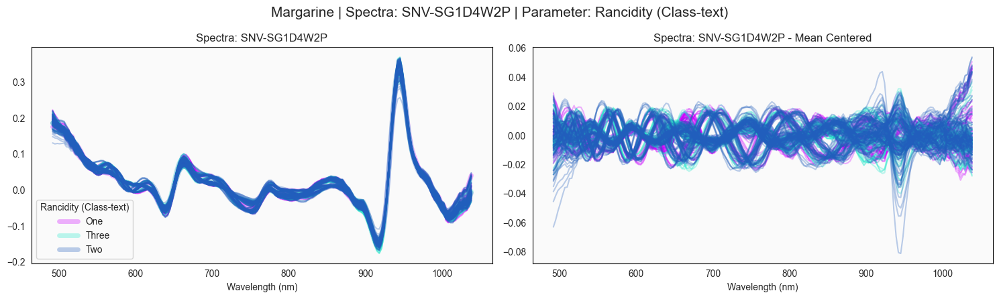

In [112]:
for param, label_type in param_label_map.items():
    plot_spectra(plot_df, labels=label_df[[param]],
                 label_type=label_type,
                 spec_prep=PREPROCESSING,
                 sample_type=SAMPLE_TYPE,
                 cmap=cmap)

Total Explained Variance: 95.934% 
Number of Components: 7


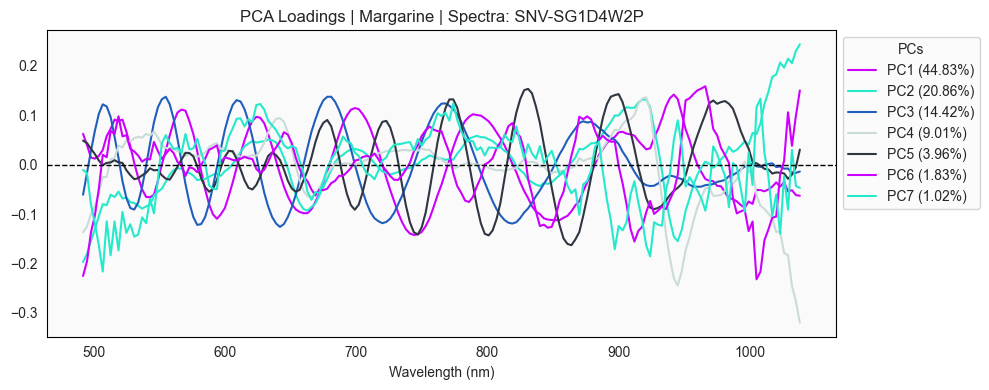

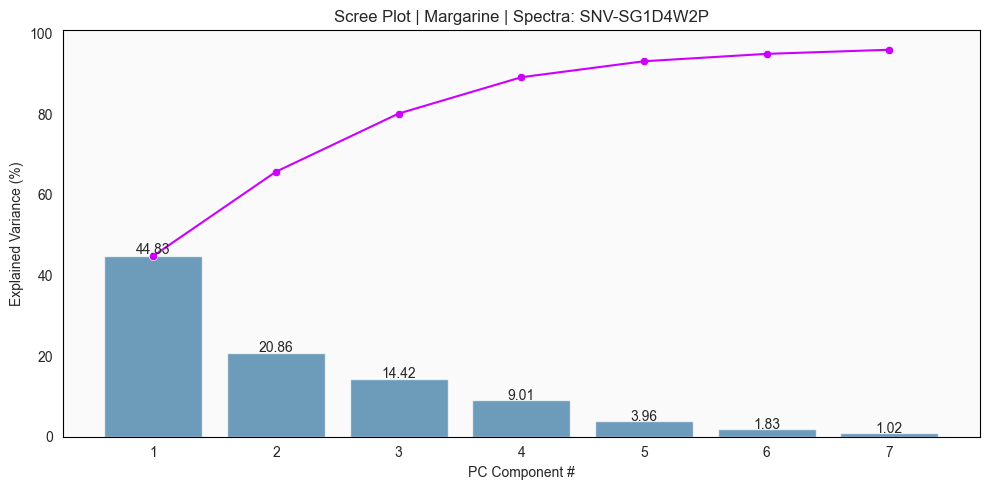

In [113]:
N_COMP = 0.95
RANDOM_STATE = 42

fitted_pc, pc_labels = fit_pca(plot_df, N_COMP, RANDOM_STATE)
fig2, ax2 = plot_loadings(plot_df, fitted_pc, pc_labels, 
                          spec_prep=PREPROCESSING, 
                          sample_type=SAMPLE_TYPE)
fig1, ax1 = plot_scree(fitted_pc,
                       spec_prep=PREPROCESSING, 
                       sample_type=SAMPLE_TYPE)
print(f"""Total Explained Variance: {fitted_pc.explained_variance_ratio_.sum()*100:.3f}% 
Number of Components: {len(fitted_pc.explained_variance_ratio_)}""")

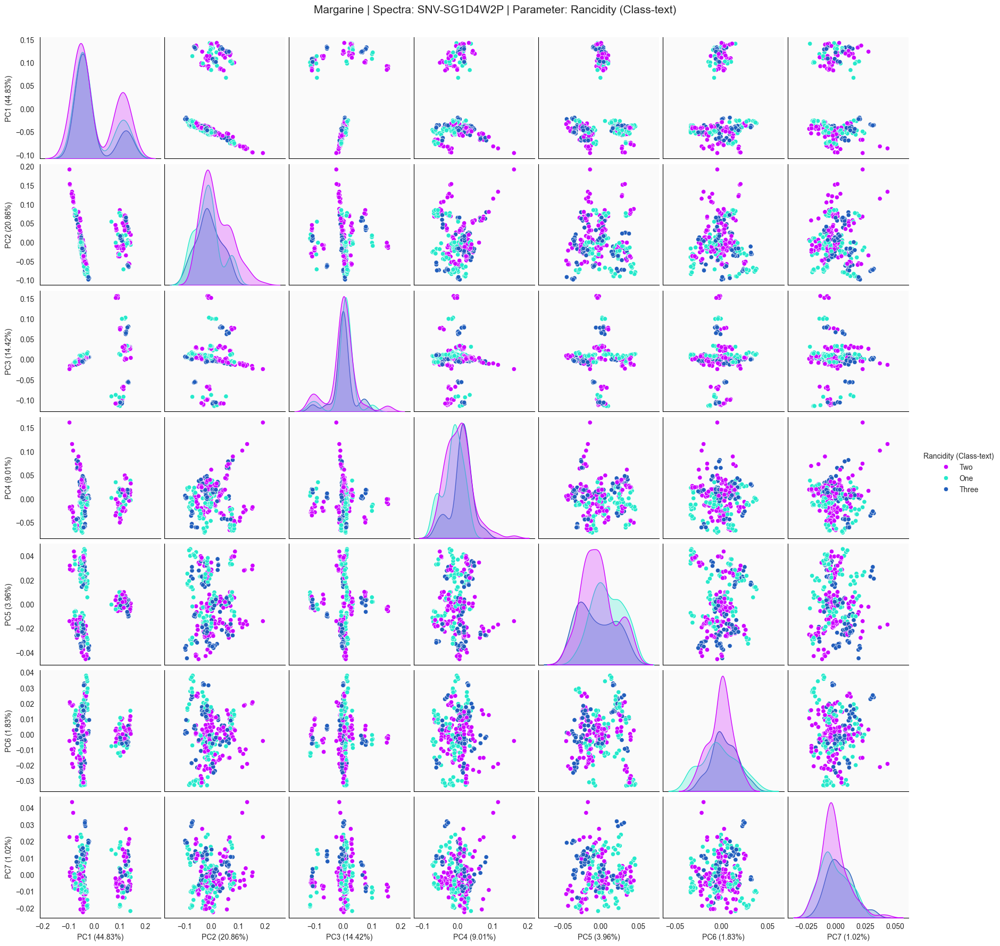

In [114]:
for param in param_label_map.keys():
    pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df[[param]])
    sns.pairplot(data=pc_df.reset_index().drop('lot_id', axis=1), hue=param)
    plt.suptitle(f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING} | Parameter: {param}', y=1.02, size=15)

In [44]:
fig = make_subplots(rows=3, cols= 2, 
                    subplot_titles=['F Test Spectra', 'F Test PCA', 
                                    'Mutual Info Spectra', 'Mutual Info PCA',
                                    'Chi2 Spectra', 'Chi2 PCA'],
                    specs=[[{'secondary_y': True}, {'secondary_y': True}],
                           [{'secondary_y': False}, {'secondary_y': False}],
                           [{'secondary_y': True}, {'secondary_y': True}]],
                    horizontal_spacing=0.15,
                    vertical_spacing=0.1)

title = f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING}'
colors = px.colors.qualitative.Plotly
pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df)
n_comp = fitted_pc.n_components_

for i, param in enumerate(param_label_map.keys()):
    try:
        f_reg_spec = f_classif(plot_df, label_df[param].values.ravel())
        f_reg_pca = f_classif(pc_df.iloc[:, :n_comp], pc_df[param].values.ravel())
        mms = MinMaxScaler()
        scaled_spec = mms.fit_transform(plot_df)
        scaled_pca = mms.fit_transform(pc_df.iloc[:, :n_comp])
        mi_spec = mutual_info_classif(scaled_spec, label_df[param].values.ravel())
        mi_pca = mutual_info_classif(scaled_pca, pc_df[param].values.ravel())
        chi2_spec = chi2(scaled_spec, label_df[param].values.ravel())
        chi2_pca = chi2(scaled_pca, pc_df[param].values.ravel())
        
        fig.add_trace(
            go.Scatter(x=plot_df.columns, y=f_reg_spec[0], marker_color=colors[i], name=param,
                       opacity=0.5, showlegend=False),
                       secondary_y=False,row=1, col=1)

        fig.add_trace(
            go.Scatter(x=plot_df.columns, y=f_reg_spec[1], name=param, marker_color=colors[i]),
                    secondary_y=True, row=1, col=1)
        
        fig.add_trace(
            go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[0], marker_color=colors[i], name=param,
                       opacity=0.5, showlegend=False),
                       secondary_y=False,row=1, col=2)

        fig.add_trace(
            go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[1], showlegend=False,
                       name=param, marker_color=colors[i]),
                    secondary_y=True, row=1, col=2)
        
        fig.add_trace(
            go.Scatter(x=plot_df.columns, y=mi_spec, marker_color=colors[i], name=param,
                       opacity=0.8, showlegend=False),
                       secondary_y=False,row=2, col=1)

        fig.add_trace(
            go.Scatter(x=pc_df.columns[:n_comp], y=mi_pca, name=param, marker_color=colors[i],
                       showlegend=False, opacity=0.8),
                    secondary_y=False, row=2, col=2)
        
        fig.add_trace(
            go.Scatter(x=plot_df.columns, y=chi2_spec[0], marker_color=colors[i], name=param,
                       opacity=0.5, showlegend=False),
                       secondary_y=False,row=3, col=1)

        fig.add_trace(
            go.Scatter(x=plot_df.columns, y=chi2_spec[1], name=param, marker_color=colors[i]),
                    secondary_y=True, row=3, col=1)
        
        fig.add_trace(
            go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[0], marker_color=colors[i], name=param,
                       opacity=0.5, showlegend=False),
                       secondary_y=False,row=3, col=2)

        fig.add_trace(
            go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[1], showlegend=False,
                       name=param, marker_color=colors[i]),
                    secondary_y=True, row=3, col=2)
        
    except:
        pass

# Add figure title
fig.update_layout(title_text=title, height=1400, width=1400)
fig.update_xaxes(title_text="Wavelengths (nm)", col=1)
fig.update_xaxes(title_text="No. of PCs", col=2)

# Set y-axes titles
fig.update_yaxes(title_text="F value", secondary_y=False, row=1)
fig.update_yaxes(title_text="p value", secondary_y=True, row=1)
fig.update_yaxes(title_text="Mutual Information", secondary_y=False, row=2)
fig.update_yaxes(title_text="Chi2", secondary_y=False, row=3)
fig.update_yaxes(title_text="p value", secondary_y=True, row=3)

fig.show()

# SG2D9W2P

In [140]:
# CONFIGS
msc = SavitzkyGolay(deriv=2, window=9, polyorder=2)
msc_df = pd.DataFrame(msc.fit_transform(raw_df), 
                      columns=raw_df.columns[4:-4], index=raw_df.index)
plot_df = msc_df.copy()
PREPROCESSING = 'SG2D9W2P'

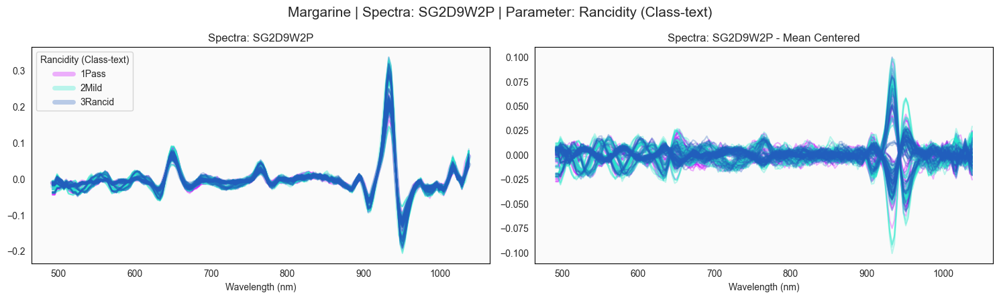

In [141]:
for param, label_type in param_label_map.items():
    plot_spectra(plot_df, labels=label_df[[param]],
                 label_type=label_type,
                 spec_prep=PREPROCESSING,
                 sample_type=SAMPLE_TYPE,
                 cmap=cmap)

Total Explained Variance: 95.322% 
Number of Components: 8


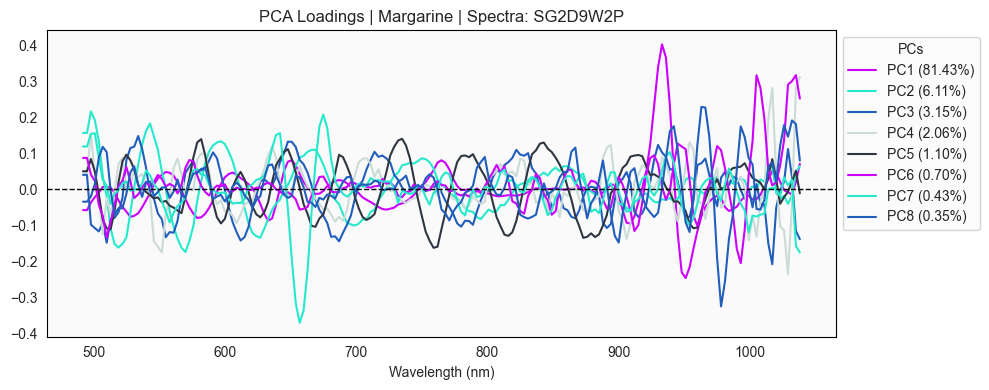

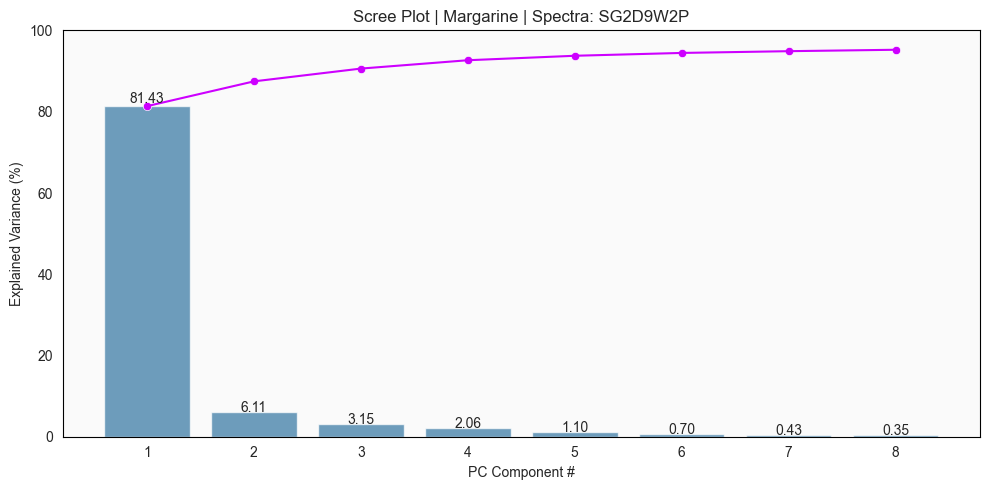

In [143]:
N_COMP = 0.95
RANDOM_STATE = 42

fitted_pc, pc_labels = fit_pca(plot_df, N_COMP, RANDOM_STATE)
fig2, ax2 = plot_loadings(plot_df, fitted_pc, pc_labels, 
                          spec_prep=PREPROCESSING, 
                          sample_type=SAMPLE_TYPE)
fig1, ax1 = plot_scree(fitted_pc,
                       spec_prep=PREPROCESSING, 
                       sample_type=SAMPLE_TYPE)
print(f"""Total Explained Variance: {fitted_pc.explained_variance_ratio_.sum()*100:.3f}% 
Number of Components: {len(fitted_pc.explained_variance_ratio_)}""")

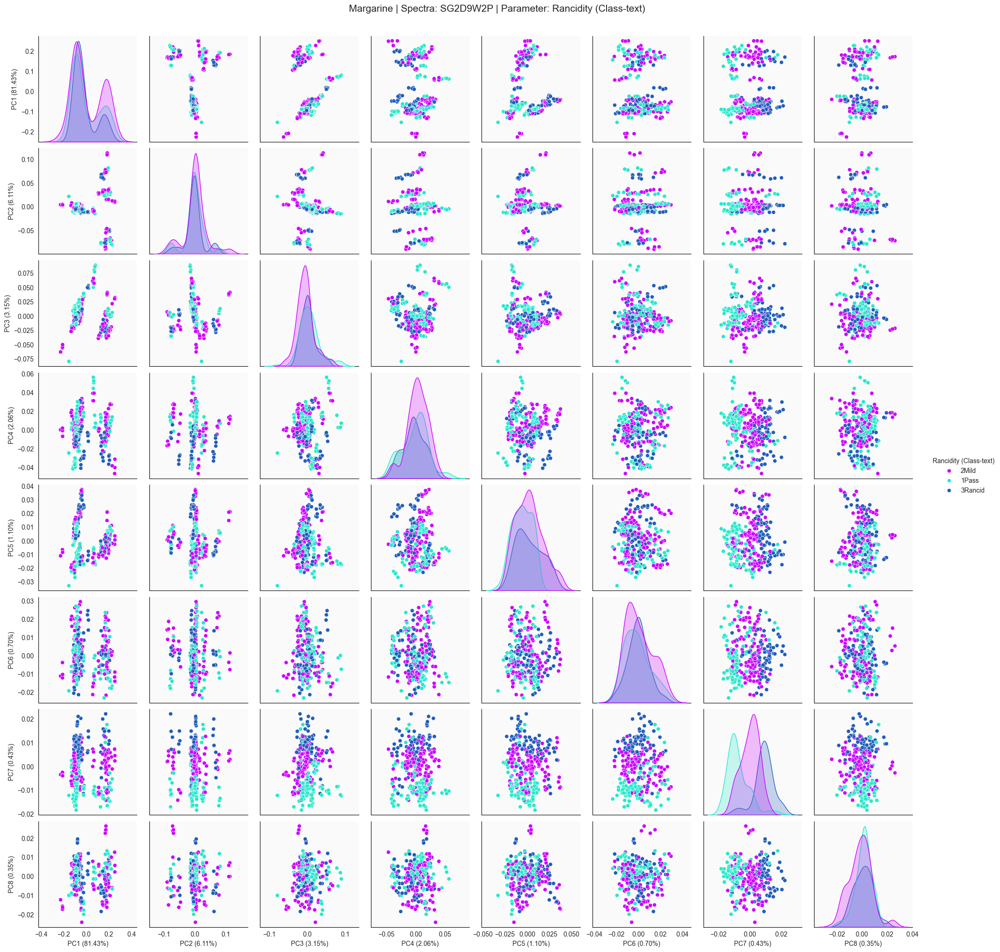

In [144]:
for param in param_label_map.keys():
    pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df[[param]])
    sns.pairplot(data=pc_df.reset_index().drop('lot_id', axis=1), hue=param)
    plt.suptitle(f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING} | Parameter: {param}', y=1.02, size=15)

In [49]:
fig = make_subplots(rows=3, cols= 2, 
                    subplot_titles=['F Test Spectra', 'F Test PCA', 
                                    'Mutual Info Spectra', 'Mutual Info PCA',
                                    'Chi2 Spectra', 'Chi2 PCA'],
                    specs=[[{'secondary_y': True}, {'secondary_y': True}],
                           [{'secondary_y': False}, {'secondary_y': False}],
                           [{'secondary_y': True}, {'secondary_y': True}]],
                    horizontal_spacing=0.15,
                    vertical_spacing=0.1)

title = f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING}'
colors = px.colors.qualitative.Plotly
pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df)
n_comp = fitted_pc.n_components_

for i, param in enumerate(param_label_map.keys()):
    try:
        f_reg_spec = f_classif(plot_df, label_df[param].values.ravel())
        f_reg_pca = f_classif(pc_df.iloc[:, :n_comp], pc_df[param].values.ravel())
        mms = MinMaxScaler()
        scaled_spec = mms.fit_transform(plot_df)
        scaled_pca = mms.fit_transform(pc_df.iloc[:, :n_comp])
        mi_spec = mutual_info_classif(scaled_spec, label_df[param].values.ravel())
        mi_pca = mutual_info_classif(scaled_pca, pc_df[param].values.ravel())
        chi2_spec = chi2(scaled_spec, label_df[param].values.ravel())
        chi2_pca = chi2(scaled_pca, pc_df[param].values.ravel())
        
        fig.add_trace(
            go.Scatter(x=plot_df.columns, y=f_reg_spec[0], marker_color=colors[i], name=param,
                       opacity=0.5, showlegend=False),
                       secondary_y=False,row=1, col=1)

        fig.add_trace(
            go.Scatter(x=plot_df.columns, y=f_reg_spec[1], name=param, marker_color=colors[i]),
                    secondary_y=True, row=1, col=1)
        
        fig.add_trace(
            go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[0], marker_color=colors[i], name=param,
                       opacity=0.5, showlegend=False),
                       secondary_y=False,row=1, col=2)

        fig.add_trace(
            go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[1], showlegend=False,
                       name=param, marker_color=colors[i]),
                    secondary_y=True, row=1, col=2)
        
        fig.add_trace(
            go.Scatter(x=plot_df.columns, y=mi_spec, marker_color=colors[i], name=param,
                       opacity=0.8, showlegend=False),
                       secondary_y=False,row=2, col=1)

        fig.add_trace(
            go.Scatter(x=pc_df.columns[:n_comp], y=mi_pca, name=param, marker_color=colors[i],
                       showlegend=False, opacity=0.8),
                    secondary_y=False, row=2, col=2)
        
        fig.add_trace(
            go.Scatter(x=plot_df.columns, y=chi2_spec[0], marker_color=colors[i], name=param,
                       opacity=0.5, showlegend=False),
                       secondary_y=False,row=3, col=1)

        fig.add_trace(
            go.Scatter(x=plot_df.columns, y=chi2_spec[1], name=param, marker_color=colors[i]),
                    secondary_y=True, row=3, col=1)
        
        fig.add_trace(
            go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[0], marker_color=colors[i], name=param,
                       opacity=0.5, showlegend=False),
                       secondary_y=False,row=3, col=2)

        fig.add_trace(
            go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[1], showlegend=False,
                       name=param, marker_color=colors[i]),
                    secondary_y=True, row=3, col=2)
        
    except:
        pass

# Add figure title
fig.update_layout(title_text=title, height=1400, width=1400)
fig.update_xaxes(title_text="Wavelengths (nm)", col=1)
fig.update_xaxes(title_text="No. of PCs", col=2)

# Set y-axes titles
fig.update_yaxes(title_text="F value", secondary_y=False, row=1)
fig.update_yaxes(title_text="p value", secondary_y=True, row=1)
fig.update_yaxes(title_text="Mutual Information", secondary_y=False, row=2)
fig.update_yaxes(title_text="Chi2", secondary_y=False, row=3)
fig.update_yaxes(title_text="p value", secondary_y=True, row=3)

fig.show()

# SNV-SG2D9W2P

In [123]:
# CONFIGS
msc = SavitzkyGolay(deriv=2, window=9, polyorder=2)
msc_df = pd.DataFrame(msc.fit_transform(SNV().fit_transform(raw_df)), 
                      columns=raw_df.columns[4:-4], index=raw_df.index)
plot_df = msc_df.copy()
PREPROCESSING = 'SNV-SG2D9W2P'

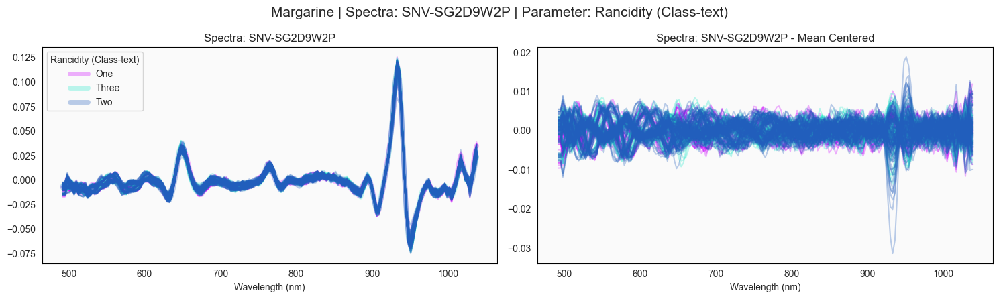

In [124]:
for param, label_type in param_label_map.items():
    plot_spectra(plot_df, labels=label_df[[param]],
                 label_type=label_type,
                 spec_prep=PREPROCESSING,
                 sample_type=SAMPLE_TYPE,
                 cmap=cmap)

Total Explained Variance: 93.219% 
Number of Components: 26


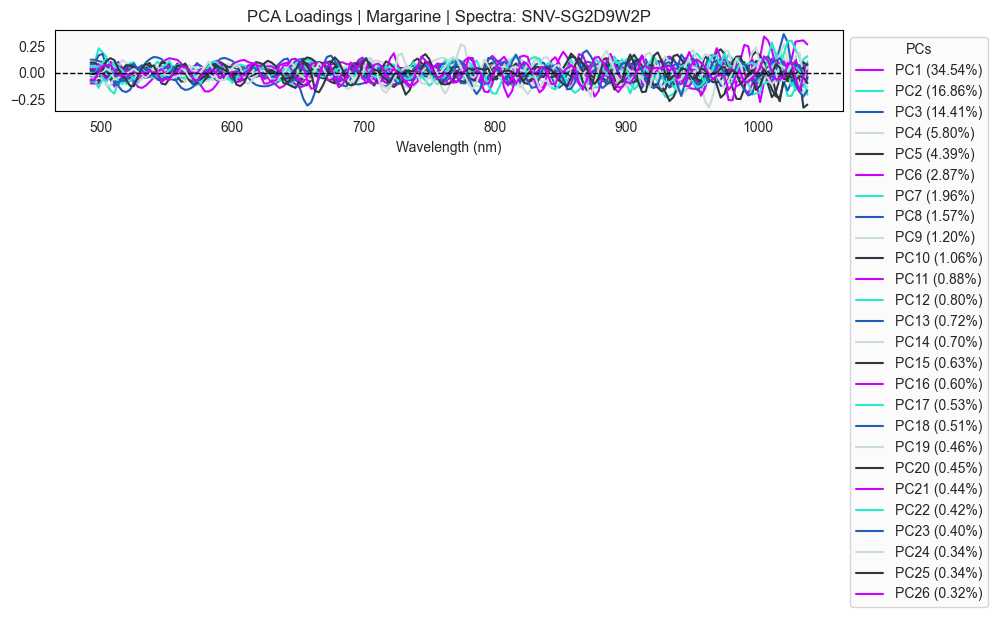

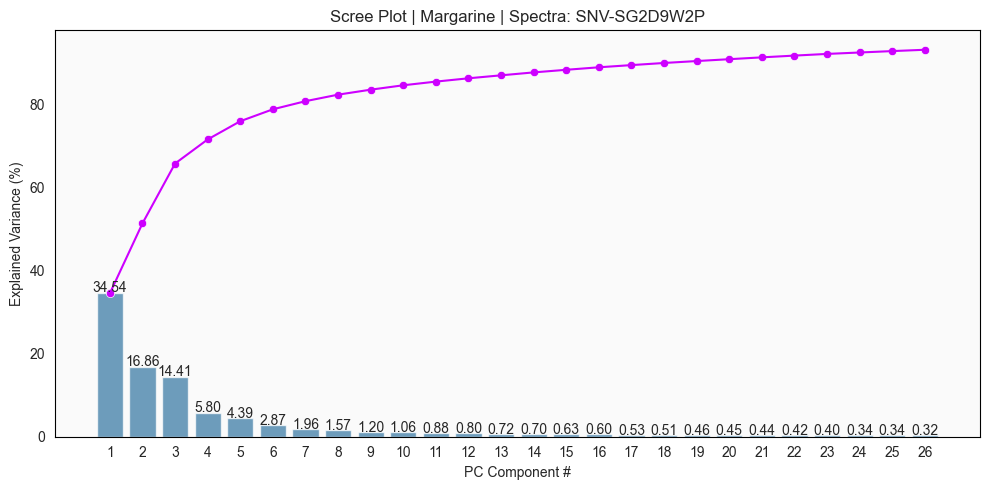

In [125]:
N_COMP = 0.93
RANDOM_STATE = 42

fitted_pc, pc_labels = fit_pca(plot_df, N_COMP, RANDOM_STATE)
fig2, ax2 = plot_loadings(plot_df, fitted_pc, pc_labels, 
                          spec_prep=PREPROCESSING, 
                          sample_type=SAMPLE_TYPE)
fig1, ax1 = plot_scree(fitted_pc,
                       spec_prep=PREPROCESSING, 
                       sample_type=SAMPLE_TYPE)
print(f"""Total Explained Variance: {fitted_pc.explained_variance_ratio_.sum()*100:.3f}% 
Number of Components: {len(fitted_pc.explained_variance_ratio_)}""")

In [ ]:
for param in param_label_map.keys():
    pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df[[param]])
    sns.pairplot(data=pc_df.reset_index().drop('lot_id', axis=1), hue=param)
    plt.suptitle(f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING} | Parameter: {param}', y=1.02, size=15)

In [ ]:
fig = make_subplots(rows=3, cols= 2, 
                    subplot_titles=['F Test Spectra', 'F Test PCA', 
                                    'Mutual Info Spectra', 'Mutual Info PCA',
                                    'Chi2 Spectra', 'Chi2 PCA'],
                    specs=[[{'secondary_y': True}, {'secondary_y': True}],
                           [{'secondary_y': False}, {'secondary_y': False}],
                           [{'secondary_y': True}, {'secondary_y': True}]],
                    horizontal_spacing=0.15,
                    vertical_spacing=0.1)

title = f'{SAMPLE_TYPE} | Spectra: {PREPROCESSING}'
colors = px.colors.qualitative.Plotly
pc_df = generate_pc_df(plot_df, fitted_pc, pc_labels, labels=label_df)
n_comp = fitted_pc.n_components_

for i, param in enumerate(param_label_map.keys()):
    try:
        f_reg_spec = f_classif(plot_df, label_df[param].values.ravel())
        f_reg_pca = f_classif(pc_df.iloc[:, :n_comp], pc_df[param].values.ravel())
        mms = MinMaxScaler()
        scaled_spec = mms.fit_transform(plot_df)
        scaled_pca = mms.fit_transform(pc_df.iloc[:, :n_comp])
        mi_spec = mutual_info_classif(scaled_spec, label_df[param].values.ravel())
        mi_pca = mutual_info_classif(scaled_pca, pc_df[param].values.ravel())
        chi2_spec = chi2(scaled_spec, label_df[param].values.ravel())
        chi2_pca = chi2(scaled_pca, pc_df[param].values.ravel())
        
        fig.add_trace(
            go.Scatter(x=plot_df.columns, y=f_reg_spec[0], marker_color=colors[i], name=param,
                       opacity=0.5, showlegend=False),
                       secondary_y=False,row=1, col=1)

        fig.add_trace(
            go.Scatter(x=plot_df.columns, y=f_reg_spec[1], name=param, marker_color=colors[i]),
                    secondary_y=True, row=1, col=1)
        
        fig.add_trace(
            go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[0], marker_color=colors[i], name=param,
                       opacity=0.5, showlegend=False),
                       secondary_y=False,row=1, col=2)

        fig.add_trace(
            go.Scatter(x=pc_df.columns[:n_comp], y=f_reg_pca[1], showlegend=False,
                       name=param, marker_color=colors[i]),
                    secondary_y=True, row=1, col=2)
        
        fig.add_trace(
            go.Scatter(x=plot_df.columns, y=mi_spec, marker_color=colors[i], name=param,
                       opacity=0.8, showlegend=False),
                       secondary_y=False,row=2, col=1)

        fig.add_trace(
            go.Scatter(x=pc_df.columns[:n_comp], y=mi_pca, name=param, marker_color=colors[i],
                       showlegend=False, opacity=0.8),
                    secondary_y=False, row=2, col=2)
        
        fig.add_trace(
            go.Scatter(x=plot_df.columns, y=chi2_spec[0], marker_color=colors[i], name=param,
                       opacity=0.5, showlegend=False),
                       secondary_y=False,row=3, col=1)

        fig.add_trace(
            go.Scatter(x=plot_df.columns, y=chi2_spec[1], name=param, marker_color=colors[i]),
                    secondary_y=True, row=3, col=1)
        
        fig.add_trace(
            go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[0], marker_color=colors[i], name=param,
                       opacity=0.5, showlegend=False),
                       secondary_y=False,row=3, col=2)

        fig.add_trace(
            go.Scatter(x=pc_df.columns[:n_comp], y=chi2_pca[1], showlegend=False,
                       name=param, marker_color=colors[i]),
                    secondary_y=True, row=3, col=2)
        
    except:
        pass

# Add figure title
fig.update_layout(title_text=title, height=1400, width=1400)
fig.update_xaxes(title_text="Wavelengths (nm)", col=1)
fig.update_xaxes(title_text="No. of PCs", col=2)

# Set y-axes titles
fig.update_yaxes(title_text="F value", secondary_y=False, row=1)
fig.update_yaxes(title_text="p value", secondary_y=True, row=1)
fig.update_yaxes(title_text="Mutual Information", secondary_y=False, row=2)
fig.update_yaxes(title_text="Chi2", secondary_y=False, row=3)
fig.update_yaxes(title_text="p value", secondary_y=True, row=3)

fig.show()